In [69]:
import colorlover as cl
import ast
import jenkspy
%load_ext autoreload
%autoreload 1
%matplotlib inline
import matplotlib.pyplot as plt
from pm4py.objects.log.importer.xes import factory as importer
from matplotlib import collections as mc
from matplotlib import cm
import pandas as pd
import numpy as np
import copy
from sklearn import linear_model
from sklearn.metrics import r2_score
%aimport BEP_PM

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
log = importer.apply('C:/Users/20173939/Documents/Study/BEP/bpi12.xes',[True])
bpi12 = BEP_PM.EventLog('BPI2012', 'concept:name', 'time:timestamp', log, resource_id='org:resource')
pf = pd.concat([pd.DataFrame(log[i]) for i in range(len(log))])
pf.loc[pf.index == 0, 'case_id'] = [i for i in range((pf.index == 0).sum())]
pf['case_id'] = pf['case_id'].fillna(method='ffill')
pf = pf[pf['lifecycle:transition'] != 'SCHEDULE']
pf = pf.sort_values(['case_id', 'time:timestamp']).reset_index(drop=True)

In [10]:
df = pd.concat([pf.groupby(['case_id', 'concept:name']).first().reset_index(), pf.groupby(['case_id', 'concept:name']).last().reset_index()], axis=1)
cols = ['case_id','concept:name', 'lifecycle:transition', 'org:resource', 'time:timestamp']
cols.extend([i+'_end' for i in cols])
df.columns = cols
df = df[df['time:timestamp'] != df['time:timestamp_end']]
df['concept:name'].unique()
df = df[(df['lifecycle:transition'] == 'START') & (df['lifecycle:transition_end'] == 'COMPLETE')]
df = df[df['org:resource'] == df['org:resource_end']]
df['concept:name'].unique()
df = df.drop([i for i in df.columns if ('end' in i and 'time' not in i) or 'lifecycle' in i], axis=1)
df.columns = ['case_id','segment_name', 'resource', 'start_time', 'end_time']

In [11]:
df['start_time'] = df['start_time'] - bpi12.first
df['end_time'] = df['end_time'] - bpi12.first
df['start_time']  = df['start_time'].dt.days*24*3600 + df['start_time'].dt.seconds
df['end_time']  = df['end_time'].dt.days*24*3600 + df['end_time'].dt.seconds
df['duration'] = df['end_time'] - df['start_time']

In [12]:
t = df.sort_values(['case_id','start_time', 'end_time']).copy()
t_s = df.sort_values(['case_id','start_time', 'end_time']).shift(-1).copy()
shelve_begin = t[t['case_id'] == t_s['case_id']][['segment_name', 'end_time', 'case_id', 'resource']]
shelve_begin.columns = ['segment_start', 'start_time', 'case_id', 'resource_start']
shelve_begin.reset_index(drop=True, inplace=True)
shelvetimes = t_s[t_s['case_id'] == t['case_id']][['start_time', 'resource', 'segment_name']]
shelvetimes.columns = ['end_time', 'resource_end', 'segment_end']
shelvetimes.reset_index(drop=True, inplace=True)
new = pd.concat([shelve_begin, shelvetimes], axis=1)
new['segment_name'] = new['segment_start'] + '-' + new['segment_end']
new['duration'] = new['end_time'] - new['start_time']
new['shelve'] = True
df = df.append(new)

In [13]:
bpi12.pf = df.reset_index(drop=True)
bpi12.pf = bpi12.pf[bpi12.pf['duration'] > 0]

In [14]:
bpi12.segments = list(dict(bpi12.pf['segment_name'].value_counts()).keys())

In [15]:
bpi12.segments = [
    'W_Afhandelen leads',
    'W_Afhandelen leads-W_Completeren aanvraag',
    'W_Completeren aanvraag',
    'W_Completeren aanvraag-W_Valideren aanvraag',
    'W_Nabellen offertes-W_Valideren aanvraag',
    'W_Afhandelen leads-W_Valideren aanvraag',
    'W_Valideren aanvraag',
    'W_Completeren aanvraag-W_Nabellen offertes',
    'W_Nabellen offertes',
    'W_Valideren aanvraag-W_Nabellen incomplete dossiers',
    'W_Nabellen incomplete dossiers',]

In [16]:
bpi12.pf = bpi12.pf[bpi12.pf['segment_name'].isin(bpi12.segments)].copy()
bpi12.pf['segment_index'] = bpi12.pf['segment_name'].apply(lambda x: list(bpi12.segments).index(x))
bpi12.pf['start_y'] = (200//len(bpi12.segments))*(len(bpi12.segments)-bpi12.pf['segment_index'])
bpi12.pf['end_y'] = bpi12.pf['start_y'] - (200//len(bpi12.segments))
bpi12.y_s = [[y, y - (200//len(bpi12.segments))] for y in range((200//len(bpi12.segments)) * len(bpi12.segments), 0, -(200//len(bpi12.segments)))]

# New loading

In [94]:
log = importer.apply('C:/Users/20173939/Documents/Study/BEP/bpi12.xes',[True])
bpi12 = BEP_PM.EventLog('BPI2012', 'concept:name', 'time:timestamp', log, resource_id='org:resource')
pf = pd.concat([pd.DataFrame(log[i]) for i in range(len(log))])
pf.loc[pf.index == 0, 'case_id'] = [i for i in range((pf.index == 0).sum())]
pf['case_id'] = pf['case_id'].fillna(method='ffill')
pf.sort_values(["case_id", "concept:name", "time:timestamp"], inplace=True)
df = pf[['case_id', "concept:name", "lifecycle:transition","org:resource","time:timestamp"]]
df = df[df['concept:name'].str.contains('W')]
df = df[df['concept:name'].str.contains('W')]

In [95]:
t = pd.concat([df, df.shift(-1)], axis=1)
t.columns = [str(i)+str(k//5) for k,i in enumerate(t.columns)]
t = t[(t['concept:name0'] == t['concept:name1']) & (t['case_id0'] == t['case_id1'])]
t = t.drop(['case_id1', 'concept:name1', 'org:resource1'], axis=1)
t['segment_name'] = t['concept:name0'] + ' ' +  t['lifecycle:transition0'] + ' - ' + t['lifecycle:transition1']
t.drop(['concept:name0','lifecycle:transition0', 'lifecycle:transition1'], axis=1, inplace=True)
t.columns = ['case_id','resource', 'start_time', 'end_time', 'segment_name']

In [96]:
bpi12.segments = t['segment_name'].unique()
bpi12.pf = t.copy()

bpi12.pf['start_time'] = bpi12.pf['start_time'] - bpi12.first
bpi12.pf['end_time'] = bpi12.pf['end_time'] - bpi12.first
bpi12.pf['start_time']  = bpi12.pf['start_time'].dt.days*24 + round(bpi12.pf['start_time'].dt.seconds/3600)
bpi12.pf['end_time']  = bpi12.pf['end_time'].dt.days*24 + round(bpi12.pf['end_time'].dt.seconds/3600)
bpi12.pf['duration'] = bpi12.pf['end_time'] - bpi12.pf['start_time']

bpi12.pf['segment_index'] = bpi12.pf['segment_name'].apply(lambda x: list(bpi12.segments).index(x))
bpi12.pf['start_y'] = (200//len(bpi12.segments))*(len(bpi12.segments)-bpi12.pf['segment_index'])
bpi12.pf['end_y'] = bpi12.pf['start_y'] - (200//len(bpi12.segments))
bpi12.y_s = [[y, y - (200//len(bpi12.segments))] for y in range((200//len(bpi12.segments)) * len(bpi12.segments), 0, -(200//len(bpi12.segments)))]

In [97]:
bpi12.classify(bpi12.pf, bpi12.classify_duration_hist, args=[4], metric='duration', inplace=True)

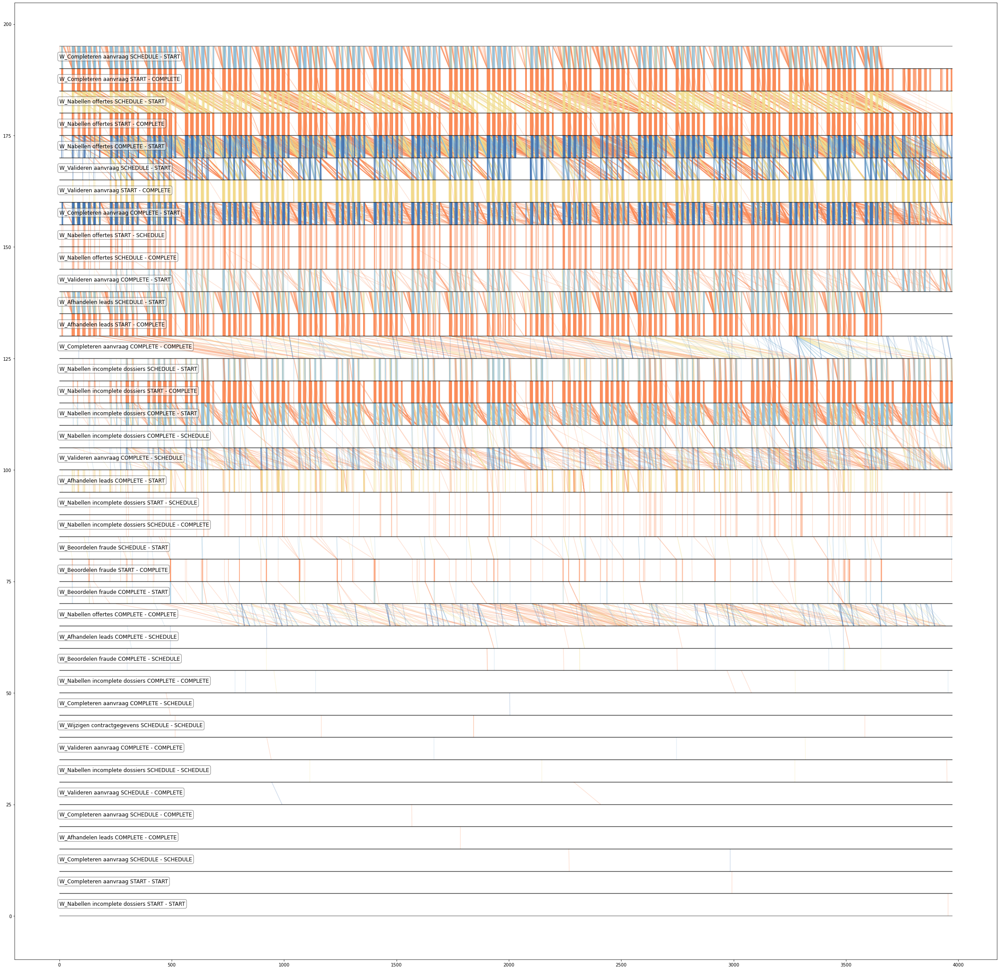

In [98]:
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
fig, ax = plt.subplots(figsize=[40,40])
bpi12.plot_performance_spectrum(class_colors, ax)

# New workload and queue new loading

In [99]:
bpi12.pf = bpi12.pf.sort_values('start_time')
bpi12.pf['end_interval'] = bpi12.pf['end_time'] // (7*24)
bpi12.pf['start_interval'] = bpi12.pf['start_time'] // (7*24)
intervals = bpi12.pf['start_interval'].unique()
total = pd.DataFrame()
print(intervals)
for interval in intervals:
    cases = bpi12.pf[(bpi12.pf['end_interval'] > interval) & (bpi12.pf['start_interval'] < interval+1)].copy()
    offset = ((cases['start_time'] - (interval* (7*24))).apply(lambda x: min(x,0)) + (((interval+1)* (7*24)) - cases['end_time']).apply(lambda x: min(x,0)))
    cases['weight'] = (cases['duration'] + offset)/(7*24)
    if len(cases) > 0:
        t = pd.DataFrame(cases.groupby(['segment_name', 'resource'])['weight'].sum())
        t.columns = ['count']
        t = t.reset_index()
        t['interval'] = interval
        total = total.append(t)

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23.]


In [100]:
total = total.groupby(['segment_name', 'resource', 'interval'])['count'].sum()
total.columns = ['count']
total = total.reset_index()
working_segments = [s for s in bpi12.segments if 'SCHEDULE' not in s]
working_hours = (total[total['segment_name'].isin(working_segments)].groupby('resource')['count'].mean())
working_segments

['W_Completeren aanvraag START - COMPLETE',
 'W_Nabellen offertes START - COMPLETE',
 'W_Nabellen offertes COMPLETE - START',
 'W_Valideren aanvraag START - COMPLETE',
 'W_Completeren aanvraag COMPLETE - START',
 'W_Valideren aanvraag COMPLETE - START',
 'W_Afhandelen leads START - COMPLETE',
 'W_Completeren aanvraag COMPLETE - COMPLETE',
 'W_Nabellen incomplete dossiers START - COMPLETE',
 'W_Nabellen incomplete dossiers COMPLETE - START',
 'W_Afhandelen leads COMPLETE - START',
 'W_Beoordelen fraude START - COMPLETE',
 'W_Beoordelen fraude COMPLETE - START',
 'W_Nabellen offertes COMPLETE - COMPLETE',
 'W_Nabellen incomplete dossiers COMPLETE - COMPLETE',
 'W_Valideren aanvraag COMPLETE - COMPLETE',
 'W_Afhandelen leads COMPLETE - COMPLETE',
 'W_Completeren aanvraag START - START',
 'W_Nabellen incomplete dossiers START - START']

In [101]:
load = pd.DataFrame(total[total['segment_name'].isin(working_segments)].groupby(['resource', 'interval'])['count'].sum())
load.reset_index(inplace=True)
load

,resource,interval,count
0,10138,1.0,0.089286
1,10138,2.0,0.083333
2,10138,4.0,0.065476
3,10138,6.0,1.184524
4,10138,7.0,0.702381
...,...,...,...
732,11309,22.0,2.214286
733,11319,19.0,2.071429
734,11319,21.0,4.077381
735,11319,22.0,6.970238


In [102]:
queue = pd.DataFrame(total[~total['segment_name'].isin(working_segments)].groupby(['resource', 'interval'])['count'].sum())
queue.reset_index(inplace=True)
queue

,resource,interval,count
0,10138,1.0,0.553571
1,10138,2.0,0.178571
2,10138,3.0,2.583333
3,10138,4.0,2.386905
4,10138,5.0,1.035714
...,...,...,...
663,11300,22.0,1.000000
664,11302,20.0,6.761905
665,11302,21.0,1.000000
666,11309,19.0,0.422619


In [103]:
bpi12.pf['load'] = bpi12.pf['start_interval'].map(load.groupby('interval')['count'].sum())

In [104]:
bpi12.pf['queue'] = bpi12.pf['start_interval'].map(queue.groupby('interval')['count'].sum())

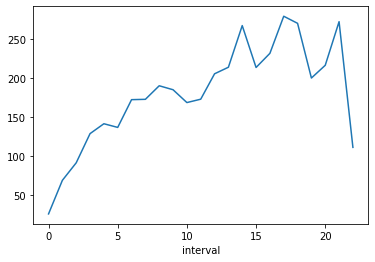

In [105]:
load.groupby('interval')['count'].sum().plot()

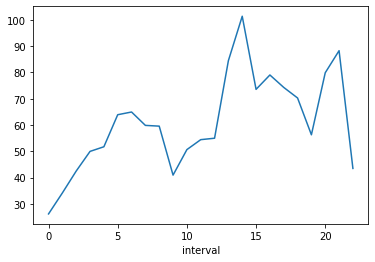

In [106]:
queue.groupby('interval')['count'].sum().plot()

In [125]:
totalplot = pd.DataFrame()
toplot = load
coefs = {}
rsq = []
for i, resource in enumerate(toplot['resource'].unique()):
    x = toplot[toplot['resource'] == resource][['interval', 'count']]
    y = bpi12.pf[(bpi12.pf['resource'] == resource)].groupby('start_interval')['duration'].mean()
    x['duration'] = x['interval'].map(y)
    x = x.dropna()
    if len(x) > 2:
        try:
            lr = linear_model.RANSACRegressor(min_samples=5)
            lr.fit(X=np.array(x['count']).reshape(-1, 1), y=x['duration'])
            fitted = lr.predict(np.array(x['count']).reshape(-1, 1))
            inlier_mask = lr.inlier_mask_
            rsq.append(lr.score(np.array(x[inlier_mask]['count']).reshape(-1, 1), y=x[inlier_mask]['duration']))
            outlier_mask = np.logical_not(inlier_mask)
#             ax = x[outlier_mask].plot(kind='scatter', x='count', y='duration', color='red')
#             x[inlier_mask].plot(kind='scatter', x='count', y='duration', ax=ax)
#             x['fitted'] = fitted
#             x.plot(x='count', y='fitted', ax=ax, label='Regression line')
#             plt.title('Resource: ' + str(resource))
#             plt.xlabel('Workload per interval (weighted case count)')
#             plt.ylabel('Average duration per interval')
            totalplot = totalplot.append(x)
            coefs[resource] = [lr.estimator_.coef_[0], lr.estimator_.intercept_]
        except ValueError:
            pass # data not big enough

c:\users\20173939\appdata\local\continuum\anaconda3\envs\bep\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\users\20173939\appdata\local\continuum\anaconda3\envs\bep\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\users\20173939\appdata\local\continuum\anaconda3\envs\bep\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\users\20173939\appdata\local\continuum\anaconda3\envs\bep\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\users\20173939\appdata\local\

In [131]:
rsq = np.array(rsq)
rsq[~np.isnan(rsq)].mean()

0.5364054480502396

Text(0.5, 0, 'Fitted regression coefficients')

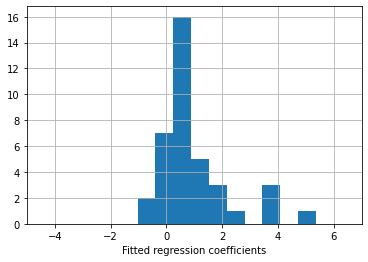

In [124]:
impact = pd.DataFrame(coefs).T
impact.columns = ['slope', 'intercept']
impact['slope'].hist(bins=120)
plt.xlim([-5,7])
plt.xlabel('Fitted regression coefficients')

Text(0, 0.5, 'average duration')

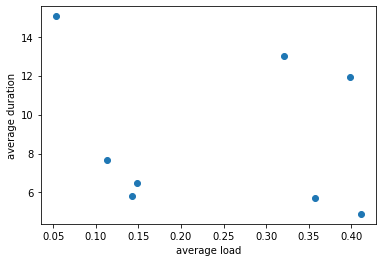

In [111]:
y = totalplot.groupby('interval')['duration'].mean()
x = totalplot.groupby('interval')['count'].mean()
plt.scatter(x,y)
plt.xlabel('average load')
plt.ylabel('average duration')

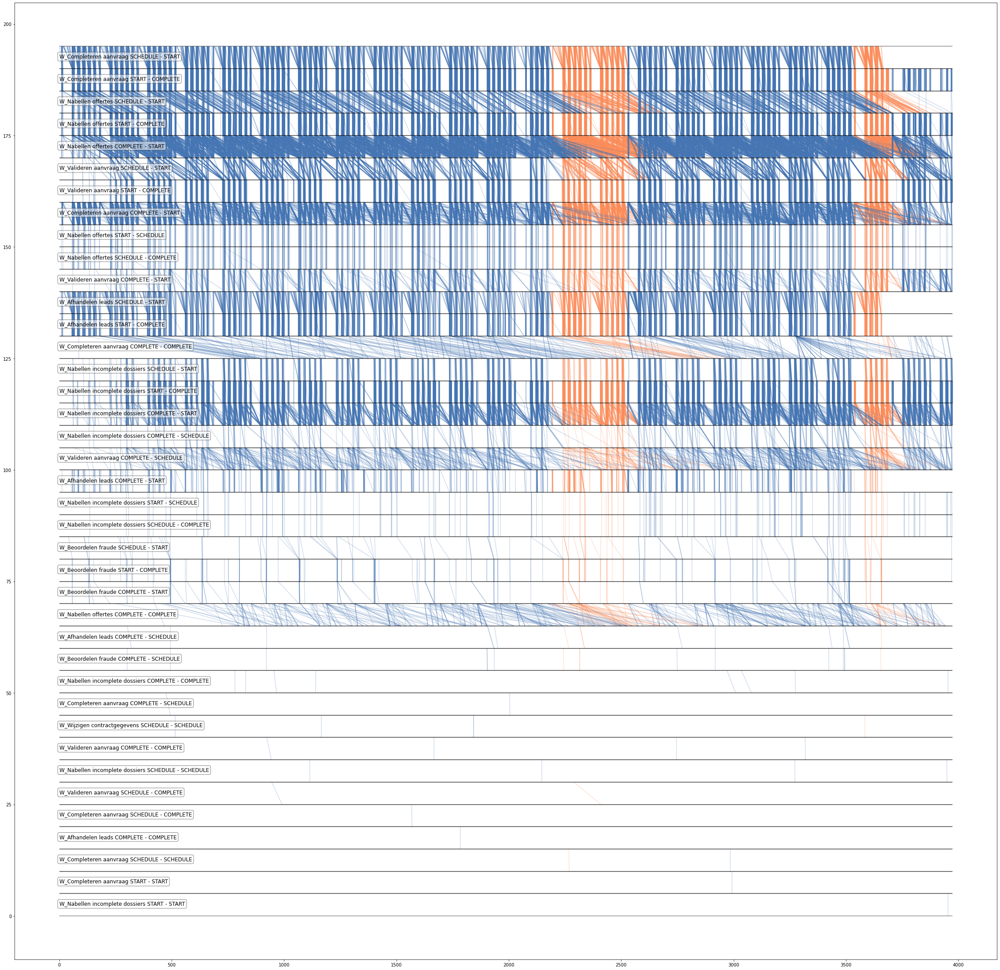

In [93]:
class_colors = [(69/256, 117/256, 180/256),
                (252/256, 141/256,89/256)]
fig, ax = plt.subplots(figsize=[40,40])
bpi12.plot_performance_spectrum(class_colors, ax, mask=bpi12.pf['queue'] > 80, vis_mask=True)

# Load previous performance spectrum data frame

In [2]:
log = importer.apply('C:/Users/20173939/Documents/Study/BEP/bpi12.xes',[True])
bpi12 = BEP_PM.EventLog('BPI2012', 'concept:name', 'time:timestamp', log, resource_id='org:resource')
bpi12.pf = pd.read_csv('bpi12.txt', index_col=0)

bpi12.segments = [
    'W_Afhandelen leads',
    'W_Afhandelen leads-W_Completeren aanvraag',
    'W_Completeren aanvraag',
    'W_Completeren aanvraag-W_Valideren aanvraag',
    'W_Nabellen offertes-W_Valideren aanvraag',
    'W_Afhandelen leads-W_Valideren aanvraag',
    'W_Valideren aanvraag',
    'W_Completeren aanvraag-W_Nabellen offertes',
    'W_Nabellen offertes',
    'W_Valideren aanvraag-W_Nabellen incomplete dossiers',
    'W_Nabellen incomplete dossiers']

bpi12.pf = bpi12.pf[bpi12.pf['segment_name'].isin(bpi12.segments)].copy()
bpi12.pf['segment_index'] = bpi12.pf['segment_name'].apply(lambda x: list(bpi12.segments).index(x))
bpi12.pf['start_y'] = (200//len(bpi12.segments))*(len(bpi12.segments)-bpi12.pf['segment_index'])
bpi12.pf['end_y'] = bpi12.pf['start_y'] - (200//len(bpi12.segments))
bpi12.y_s = [[y, y - (200//len(bpi12.segments))] for y in range((200//len(bpi12.segments)) * len(bpi12.segments), 0, -(200//len(bpi12.segments)))]

# Testing predictor

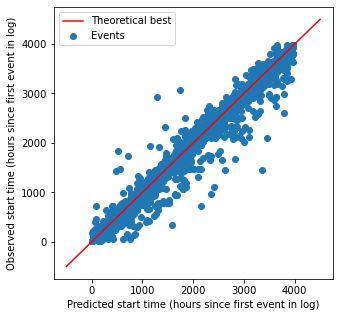

In [28]:
t = bpi12.pf[~bpi12.pf['segment_name'].str.contains('-')].sort_values(['resource', 'end_time'])
t['predicted_start'] = t.shift()[t.shift()['resource'] == t['resource']]['end_time']
mapper = {ind:row['predicted_start'] for ind, row in t.iterrows()}
bpi12.pf['predicted_start'] =  bpi12.pf.index.map(mapper)
errors = (t['start_time'] - t['predicted_start'])
fig, ax = plt.subplots(figsize=[5,5])
ax.scatter(t['predicted_start']/3600, t['start_time']/3600, label='Events')
ax.plot(ax.get_xticks(), ax.get_yticks(), color='red', label='Theoretical best')
ax.set_xlabel('Predicted start time (hours since first event in log)')
ax.set_ylabel('Observed start time (hours since first event in log)')
ax.legend()

In [18]:
from scipy import stats 
df = pd.DataFrame(errors.dropna())
df['zscore'] = zscores = stats.zscore(df[0].dropna()**2)
t['outlier'] = False
t.loc[t.index.isin(df[df['zscore'] > (df['zscore'].std()*10)].index), 'outlier'] = True
mapper = {ind:row['outlier'] for ind, row in t.iterrows()}
bpi12.pf['outlier'] =  bpi12.pf.index.map(mapper)
bpi12.pf['outlier'].fillna(False, inplace=True)

Text(0.5, 1.0, 'Outlier segments (yellow), isolated in the plot using Z-scores.')

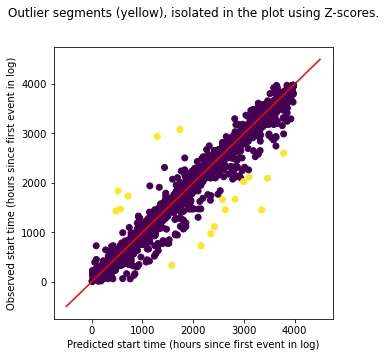

In [33]:
fig, ax = plt.subplots(figsize=[5,5])
ax.scatter(t['predicted_start']/3600, t['start_time']/3600, c=t['outlier'])
ax.plot(ax.get_xticks(), ax.get_yticks(), color='red')
ax.set_xlabel('Predicted start time (hours since first event in log)')
ax.set_ylabel('Observed start time (hours since first event in log)')
plt.title('Outlier segments (yellow), isolated in the plot using Z-scores.', pad=30)

In [50]:
(t.groupby('outlier')['duration'].mean()/3600)

outlier
False     19.323584
True     851.963395
Name: duration, dtype: float64

Text(0.5, 0, 'Error (real - inferred)')

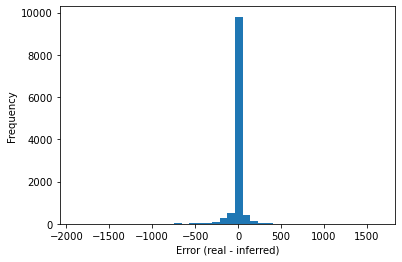

In [53]:
(errors/3600).plot(kind='hist', bins=40)
bpi12.pf['error'] = bpi12.pf.index.map(dict(errors))
plt.xlabel('Error (real - inferred)')

Text(0.5, 1.0, 'Mean sqaured error per segment')

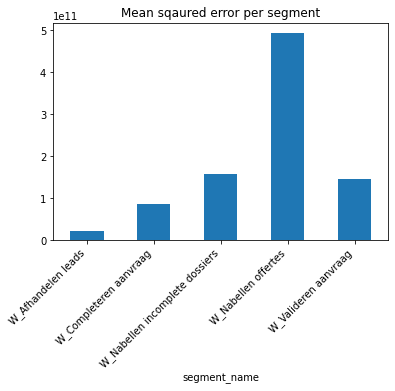

In [21]:
bpi12.pf['error_sq'] = bpi12.pf['error']**2
(bpi12.pf[~bpi12.pf['error'].isna()].groupby('segment_name')['error_sq']).mean().plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Mean sqaured error per segment')

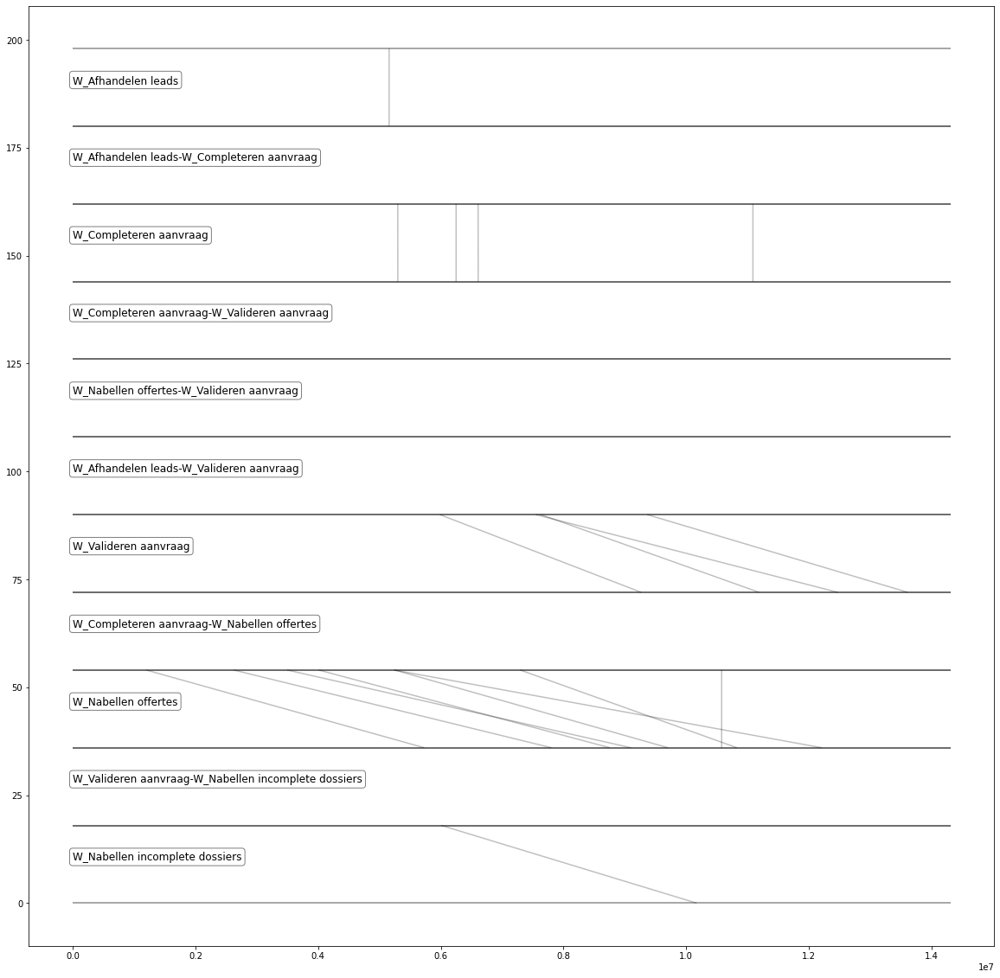

In [22]:
class_colors = [(1,1,1),(0,0,0)]
fig, ax = plt.subplots(figsize=[20,20])
bpi12.plot_performance_spectrum(class_colors, ax, mask=bpi12.pf['outlier'],vis_mask=True, label_offset=-500, order='reversed')

# Full default performance spectrum:

In [10]:
bpi12.classify(bpi12.pf, bpi12.classify_duration_hist, metric='duration', args=[4], inplace=True)

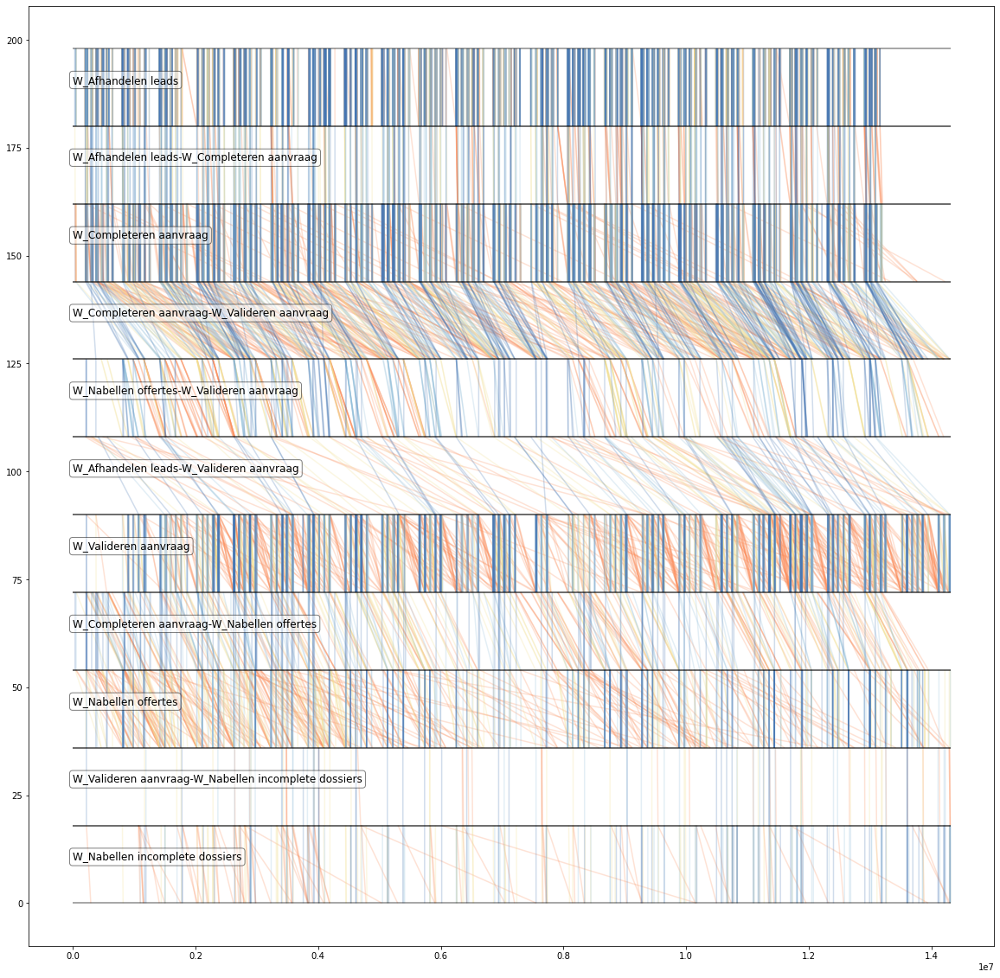

In [11]:
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
fig, ax = plt.subplots(figsize=[20,20])
bpi12.plot_performance_spectrum(class_colors, ax, label_offset=-500, classifier=bpi12.classify_duration_hist, metric='duration', args=[4])

# Caculate workload and quelength

In [92]:
bpi12.pf['end_interval'] = bpi12.pf['end_time'] // (7*24*3600)
bpi12.pf['start_interval'] = bpi12.pf['start_time'] // (7*24*3600)
intervals = bpi12.pf['start_interval'].unique()
segments = [s for s in bpi12.segments]
que_total = {s:{} for s in segments}
load_total = {s:{} for s in segments}

for interval in intervals:
    cases = bpi12.pf[((bpi12.pf['start_interval'] <= interval) & (bpi12.pf['end_interval'] >= interval+1)) | ((bpi12.pf['start_interval'] == interval) & (interval == bpi12.pf['end_interval']))]
    for segment in segments:
        que = dict(cases[(cases['shelve'] == True) & (cases['segment_end'] == segment)]['resource_end'].value_counts())
        load = dict(cases[(cases['segment_name'] == segment) & (cases['shelve'] != True)]['resource'].value_counts())
        que_total[segment][interval] = que
        load_total[segment][interval] = load

que_df = pd.DataFrame(que_total[list(que_total.keys())[0]]).T.sort_index().fillna(0)
for segment in list(que_total.keys())[1:]:
    temp = pd.DataFrame(que_total[segment]).T.sort_index().fillna(0)
    for resource in temp.columns:
        if resource in que_df.columns:
            que_df[resource] += temp[resource]
        else:
            que_df[resource] = temp[resource]
            
load_df = pd.DataFrame(load_total[list(load_total.keys())[0]]).T.sort_index().fillna(0)
for segment in list(load_total.keys())[1:]:
    temp = pd.DataFrame(load_total[segment]).T.sort_index().fillna(0)
    for resource in temp.columns:
        if resource in load_df.columns:
            load_df[resource] += temp[resource]
        else:
            load_df[resource] = temp[resource]

In [93]:
# load_df['working_in_segment'] = bpi12.pf[bpi12.pf['segment_name'] == 'W_Valideren aanvraag'].groupby('start_interval')['resource'].unique()
# que_df['working_in_segment'] = bpi12.pf[bpi12.pf['segment_name'] == 'W_Valideren aanvraag'].groupby('start_interval')['resource'].unique()

# total = []
# for ind, row in que_df.iterrows():
#     if row['working_in_segment'] is not np.nan:
#         total.append(row[[str(i) for i in row['working_in_segment'] if str(i) in row.index]].sum())
#     else:
#         total.append(0)
# que_df['que'] = total

# total = []
# for ind, row in load_df.iterrows():
#     if row['working_in_segment'] is not np.nan:
#         total.append(row[[str(i) for i in row['working_in_segment'] if str(i) in row.index]].sum())
#     else:
#         total.append(0)
# load_df['load'] = total

In [94]:
que_df['que'] = que_df.mean(axis=1)
load_df['load'] = load_df.mean(axis=1)

In [95]:
def goodness_of_variance_fit(array, classes):
    # get the break points
    classes = jenkspy.jenks_breaks(array, classes)

    # do the actual classification
    classified = np.array([classify(i, classes) for i in array])

    # max value of zones
    maxz = max(classified)

    # nested list of zone indices
    zone_indices = [[idx for idx, val in enumerate(classified) if zone + 1 == val] for zone in range(maxz)]

    # sum of squared deviations from array mean
    sdam = np.sum((array - array.mean()) ** 2)

    # sorted polygon stats
    array_sort = [np.array([array[index] for index in zone]) for zone in zone_indices]

    # sum of squared deviations of class means
    sdcm = sum([np.sum((classified - classified.mean()) ** 2) for classified in array_sort])

    # goodness of variance fit
    gvf = (sdam - sdcm) / sdam

    return gvf

def classify(value, breaks):
    for i in range(1, len(breaks)):
        if value < breaks[i]:
            return i
    return len(breaks) - 1

In [96]:
gvf = 0.0
nclasses = 2
old = 0
while True:
    gvf = goodness_of_variance_fit(np.array(que_df['que'].fillna(method='ffill')), nclasses)
    if (gvf-old) < 0.01:
        break
    old = gvf
    nclasses += 1

print(nclasses)
breaks = jenkspy.jenks_breaks(que_df['que'], nb_class=nclasses)
breaks = [[breaks[i], breaks[i+1]] for i in range(len(breaks)-1)]
classed = [list(que_df[(que_df['que'] >= x) & (que_df['que'] < y)].index) for x,y in breaks]
for i,todo in enumerate(classed):
    for c in todo:
        que_df.loc[c, 'que_class'] = i
que_df['que_class'] = que_df['que_class'].fillna(method='ffill')
bpi12.pf['que_class'] = list(que_df.loc[bpi12.pf['start_interval']]['que_class'])
que_breaks = breaks

6


In [97]:
gvf = 0.0
nclasses = 2
old = 0
while True:
    gvf = goodness_of_variance_fit(np.array(load_df['load'].fillna(method='ffill')), nclasses)
    if (gvf-old) < 0.01:
        break
    old = gvf
    nclasses += 1

print(nclasses)
breaks = jenkspy.jenks_breaks(load_df['load'], nb_class=nclasses)
breaks = [[breaks[i], breaks[i+1]] for i in range(len(breaks)-1)]
classed = [list(load_df[(load_df['load'] >= x) & (load_df['load'] < y)].index) for x,y in breaks]
for i,todo in enumerate(classed):
    for c in todo:
        load_df.loc[c, 'load_class'] = i
load_df['load_class'] = load_df['load_class'].fillna(method='ffill')
bpi12.pf['load_class'] = list(load_df.loc[bpi12.pf['start_interval']]['load_class'])
load_breaks = breaks

7


(0.0, 9.0)

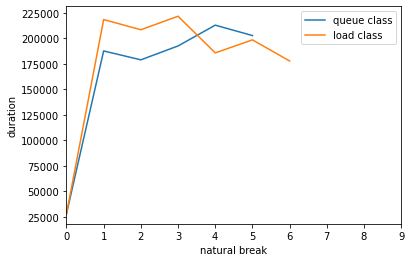

In [98]:
plot = bpi12.pf.groupby('que_class')['duration'].mean()
plot = pd.concat([plot, bpi12.pf.groupby('load_class')['duration'].mean()], axis=1)
plot.columns = ['queue class', 'load class']
plot.plot()
plt.ylabel('duration')
plt.xlabel('natural break')
plt.xlim([0,9])

Text(0, 0.5, 'queue class')

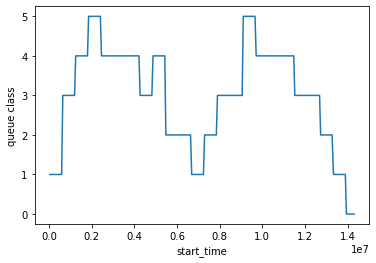

In [99]:
bpi12.pf.groupby('start_time')['que_class'].mean().plot()
plt.ylabel('queue class')

Text(0, 0.5, 'load class')

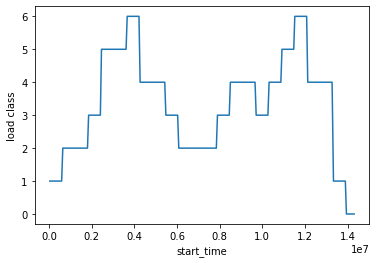

In [100]:
bpi12.pf.groupby('start_time')['load_class'].mean().plot()
plt.ylabel('load class')

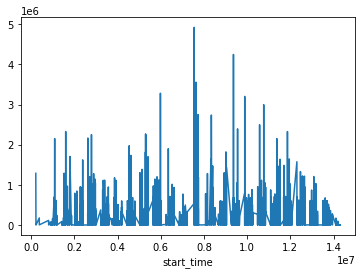

In [101]:
bpi12.pf[bpi12.pf['segment_name'] == 'W_Valideren aanvraag'].groupby('start_time')['duration'].mean().plot()

Text(0, 0.5, 'Number of items worked on')

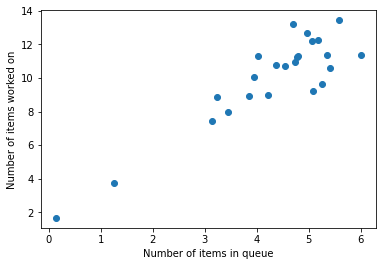

In [102]:
plt.scatter(que_df['que'],load_df['load'])
plt.xlabel('Number of items in queue')
plt.ylabel('Number of items worked on')

# Upgraded colors performance spectrum

In [103]:
# mapper = {row['case_id']: row['que_class'] for ind, row in bpi12.pf[bpi12.pf['segment_name'] == 'W_Valideren aanvraag'][['case_id', 'que_class']].iterrows()}
# bpi12.pf['global que_class'] = bpi12.pf['case_id'].map(mapper)

# mapper = {row['case_id']: row['load_class'] for ind, row in bpi12.pf[bpi12.pf['segment_name'] == 'W_Valideren aanvraag'][['case_id', 'load_class']].iterrows()}
# bpi12.pf['global load_class'] = bpi12.pf['case_id'].map(mapper)

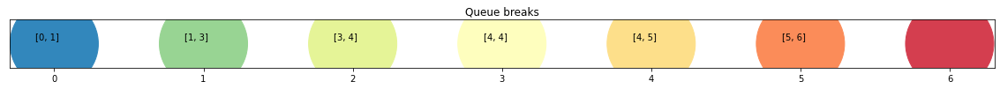

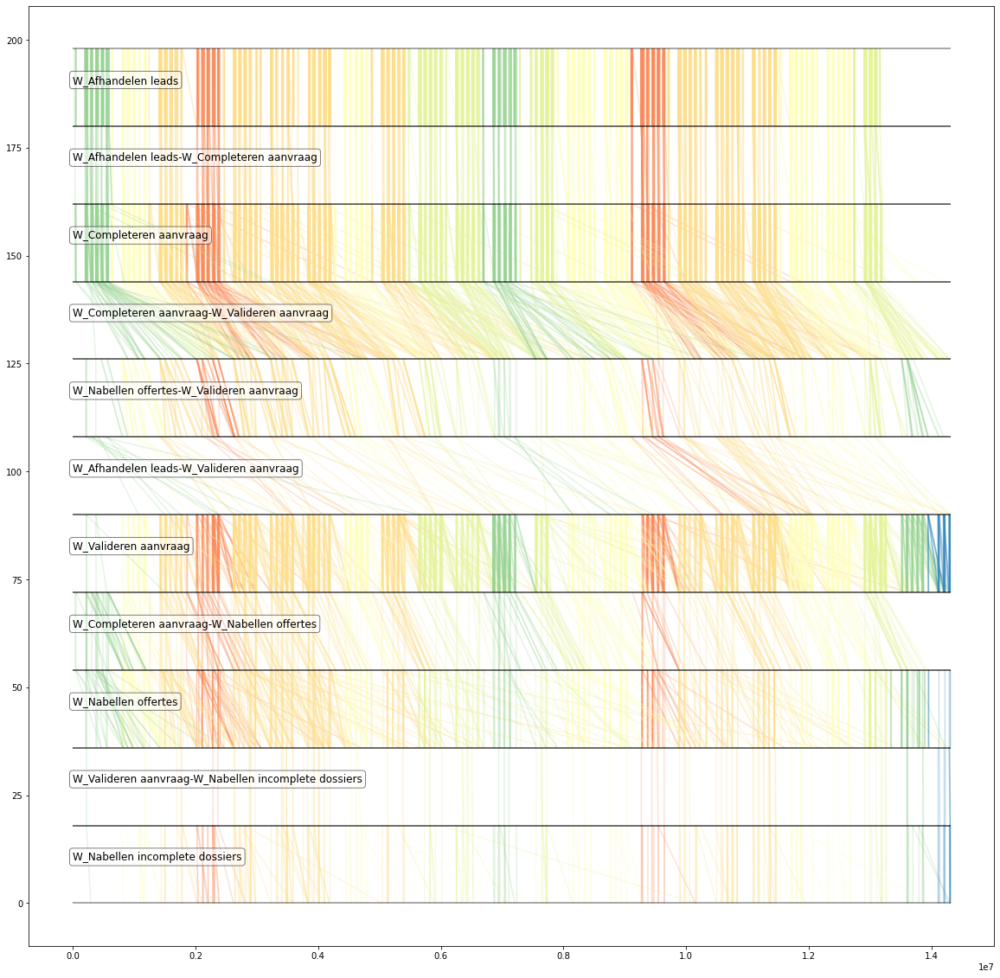

In [104]:
color_scale = cl.scales[str(len(load_breaks))]['div']['Spectral']
color_scale = list(reversed([[k/256 for k in ast.literal_eval(i.replace('rgb', ''))] for i in color_scale]))


x = [i for i in range(len(color_scale))]
y = [0 for i in range(len(color_scale))]
fig, ax = plt.subplots(figsize=[20,1])
ax.scatter(x, y, c=color_scale, s=10000)
for i, txt in enumerate(que_breaks):
    ax.annotate([int(i) for i in txt], (x[i]-0.125, y[i]+0.01))
ax.set_xticks(x)
ax.set_yticks([])
plt.title('Queue breaks')

class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]

# bpi12.classify(bpi12.pf, bpi12.classify_duration_hist,  'duration', [4], inplace=True)
bpi12.pf['class'] = bpi12.pf['que_class']
fig, ax = plt.subplots(figsize=[20,20])
bpi12.plot_performance_spectrum(color_scale, ax, label_offset=-100)

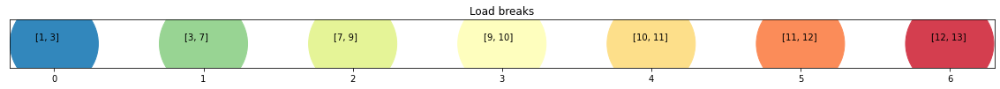

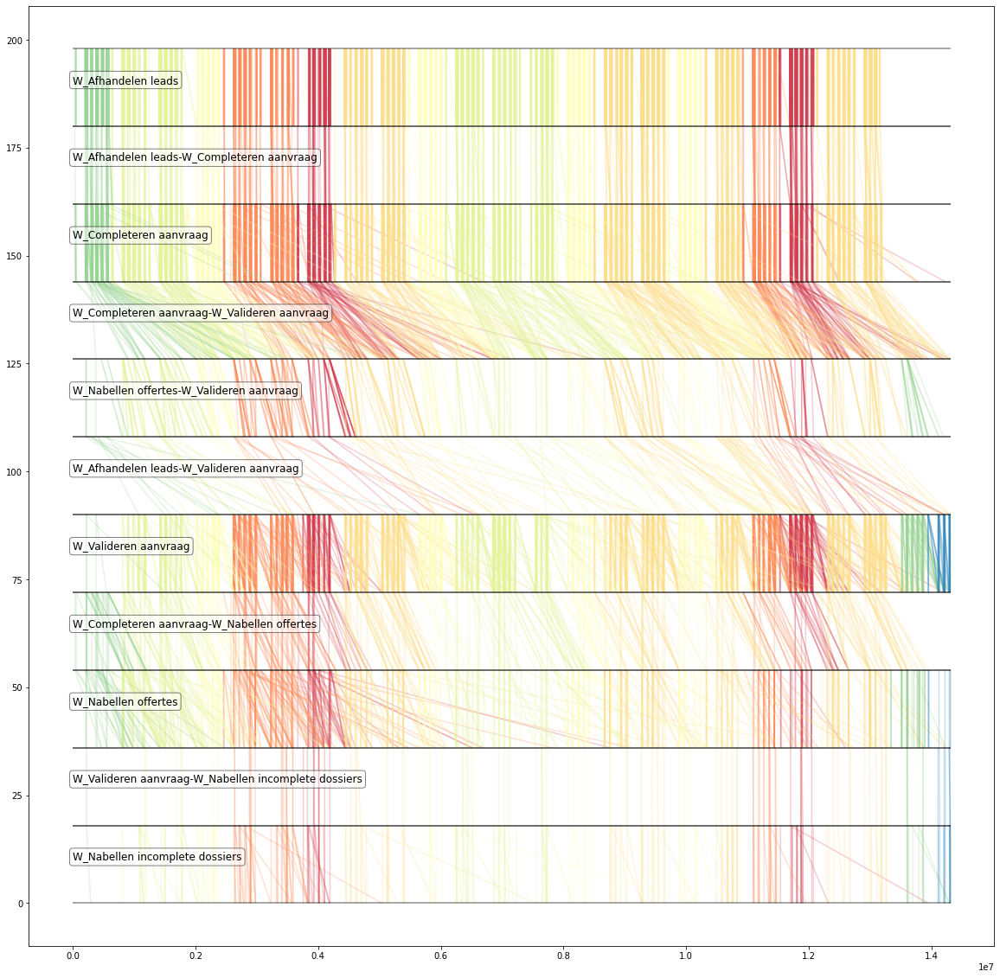

In [105]:
color_scale = cl.scales[str(len(load_breaks))]['div']['Spectral']
color_scale = list(reversed([[k/256 for k in ast.literal_eval(i.replace('rgb', ''))] for i in color_scale]))


x = [i for i in range(len(color_scale))]
y = [0 for i in range(len(color_scale))]
fig, ax = plt.subplots(figsize=[20,1])
ax.scatter(x, y, c=color_scale, s=10000)
for i, txt in enumerate(load_breaks):
    ax.annotate([int(i) for i in txt], (x[i]-0.125, y[i]+0.01))
ax.set_xticks(x)
ax.set_yticks([])
plt.title('Load breaks')

class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]

# bpi12.classify(bpi12.pf, bpi12.classify_duration_hist,  'duration', [4], inplace=True)
bpi12.pf['class'] = bpi12.pf['load_class']
fig, ax = plt.subplots(figsize=[20,20])
bpi12.plot_performance_spectrum(color_scale, ax, label_offset=-100)

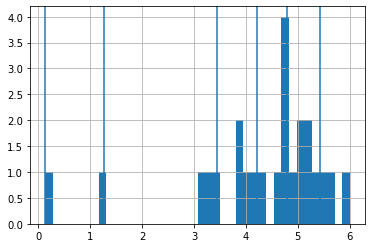

In [106]:
ax = que_df['que'].hist(bins=40)
for x in que_breaks:
    ax.axvline(x[0])

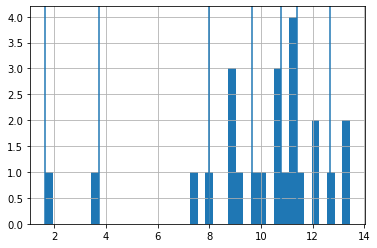

In [107]:
ax = load_df['load'].hist(bins=40)
for x in load_breaks:
    ax.axvline(x[0])

In [108]:
bpi12.pf.loc[(bpi12.pf['que_class'] < 1) & (bpi12.pf['load_class'] < 1), 'combined'] = 0
bpi12.pf.loc[(bpi12.pf['que_class'] > 2) & (bpi12.pf['load_class'] > 2), 'combined'] = 1

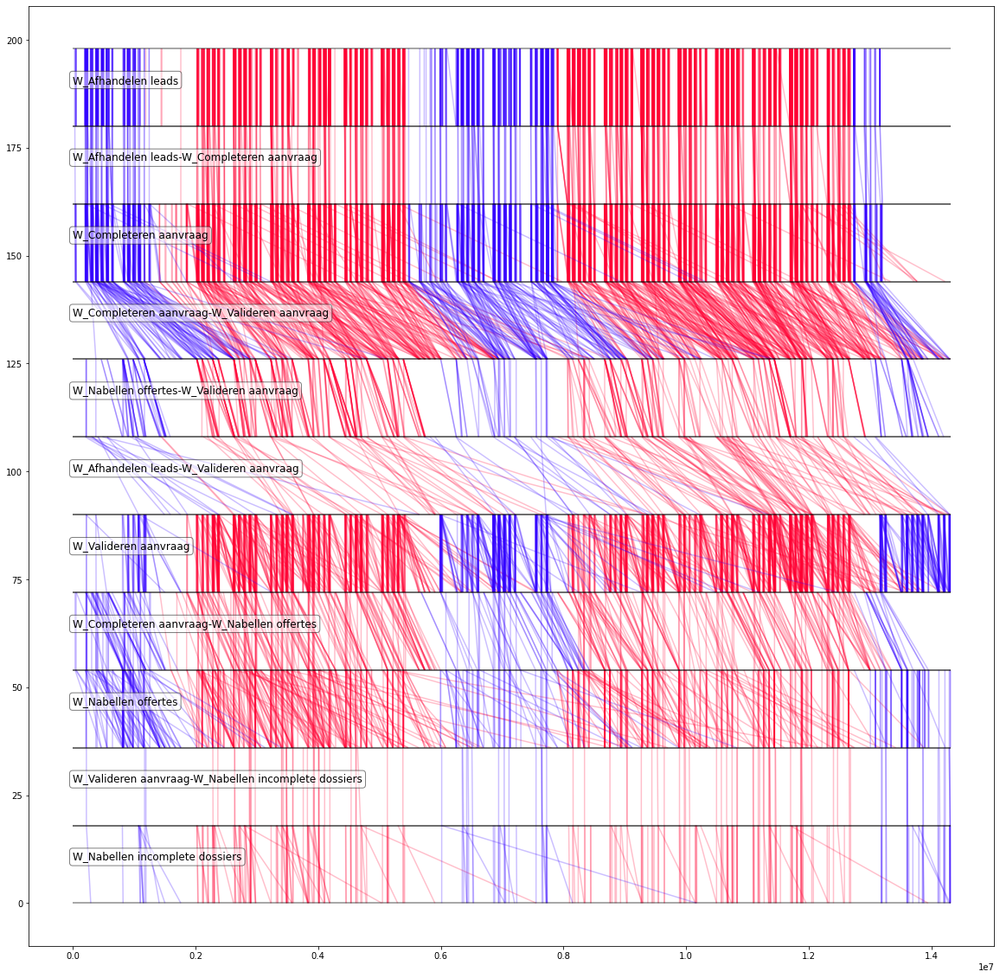

In [109]:
class_colors = [(0.2,0,1), (1,0,0.2)]
# bpi12.classify(bpi12.pf, bpi12.classify_duration_hist,  'duration', [4], inplace=True)
bpi12.pf['class'] = bpi12.pf['combined']
fig, ax = plt.subplots(figsize=[20,20])
bpi12.plot_performance_spectrum(class_colors, ax, label_offset=-100)

# New workload and queue old loading

In [ ]:
bpi12.pf.loc[bpi12.pf['resource'].isna(), 'resource'] = bpi12.pf[bpi12.pf['resource'].isna()]['resource_end'] 

In [31]:
bpi12.pf['end_interval'] = bpi12.pf['end_time'] // (7*24)
bpi12.pf['start_interval'] = bpi12.pf['start_time'] // (7*24)
intervals = bpi12.pf['start_interval'].unique()
total = pd.DataFrame()
print(intervals)
for interval in intervals:
    cases = bpi12.pf[(bpi12.pf['end_interval'] > interval) & (bpi12.pf['start_interval'] < interval+1)].copy()
    offset = ((cases['start_time'] - (interval* (7*24))).apply(lambda x: min(x,0)) + (((interval+1)* (7*24)) - cases['end_time']).apply(lambda x: min(x,0)))
    cases['weight'] = (cases['duration'] + offset)/(7*24)
    if len(cases) > 0:
        t = pd.DataFrame(cases.groupby(['segment_name', 'resource'])['weight'].sum())
        t.columns = ['count']
        t = t.reset_index()
        t['interval'] = interval
        total = total.append(t)

[ 6373   299  4854 ... 81064 78494 78572]


In [32]:
total = total.groupby(['segment_name', 'resource', 'interval'])['count'].sum()
total.columns = ['count']
total = total.reset_index()
working_segments = [s for s in bpi12.segments if '-' not in s]
working_hours = (total[total['segment_name'].isin(working_segments)].groupby('resource')['count'].mean())
working_segments

['W_Afhandelen leads',
 'W_Completeren aanvraag',
 'W_Valideren aanvraag',
 'W_Nabellen offertes',
 'W_Nabellen incomplete dossiers']

In [33]:
load = pd.DataFrame(total[total['segment_name'].isin(working_segments)].groupby(['resource', 'interval'])['count'].sum())
load['duration'] = bpi12.pf[total['segment_name'].isin(working_segments)].groupby(['resource', 'start_interval'])['duration'].mean()
load.reset_index(inplace=True)

c:\users\20173939\appdata\local\continuum\anaconda3\envs\bep\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


In [34]:
queue = pd.DataFrame(total[~total['segment_name'].isin(working_segments)].groupby(['resource', 'interval'])['count'].sum())
queue.reset_index(inplace=True)
queue

,resource,interval,count
0,10138.0,254,0.839286
1,10138.0,299,1.000000
2,10138.0,305,1.000000
3,10138.0,314,1.000000
4,10138.0,315,1.000000
...,...,...,...
145975,11339.0,85131,1.000000
145976,11339.0,85134,1.000000
145977,11339.0,85138,1.000000
145978,11339.0,85141,1.000000


In [35]:
bpi12.pf['load'] = bpi12.pf['start_interval'].map(load.groupby('interval')['count'].sum())

In [36]:
bpi12.pf['queue'] = bpi12.pf['start_interval'].map(queue.groupby('interval')['count'].sum())

Text(0, 0.5, 'average duration')

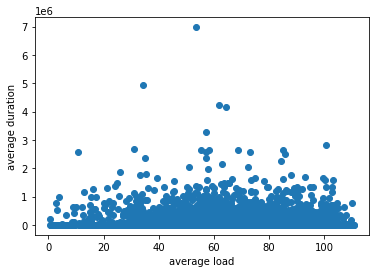

In [37]:
y = bpi12.pf.groupby('load')['duration'].mean()
x = bpi12.pf.groupby('load')['duration'].mean().index
plt.scatter(x,y)
plt.xlabel('average load')
plt.ylabel('average duration')

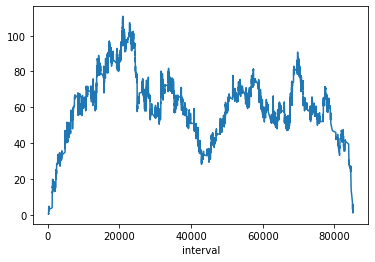

In [38]:
load.groupby('interval')['count'].sum().plot()

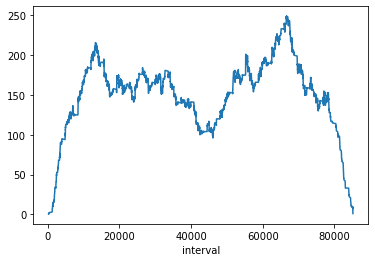

In [40]:
queue.groupby('interval')['count'].sum().plot()

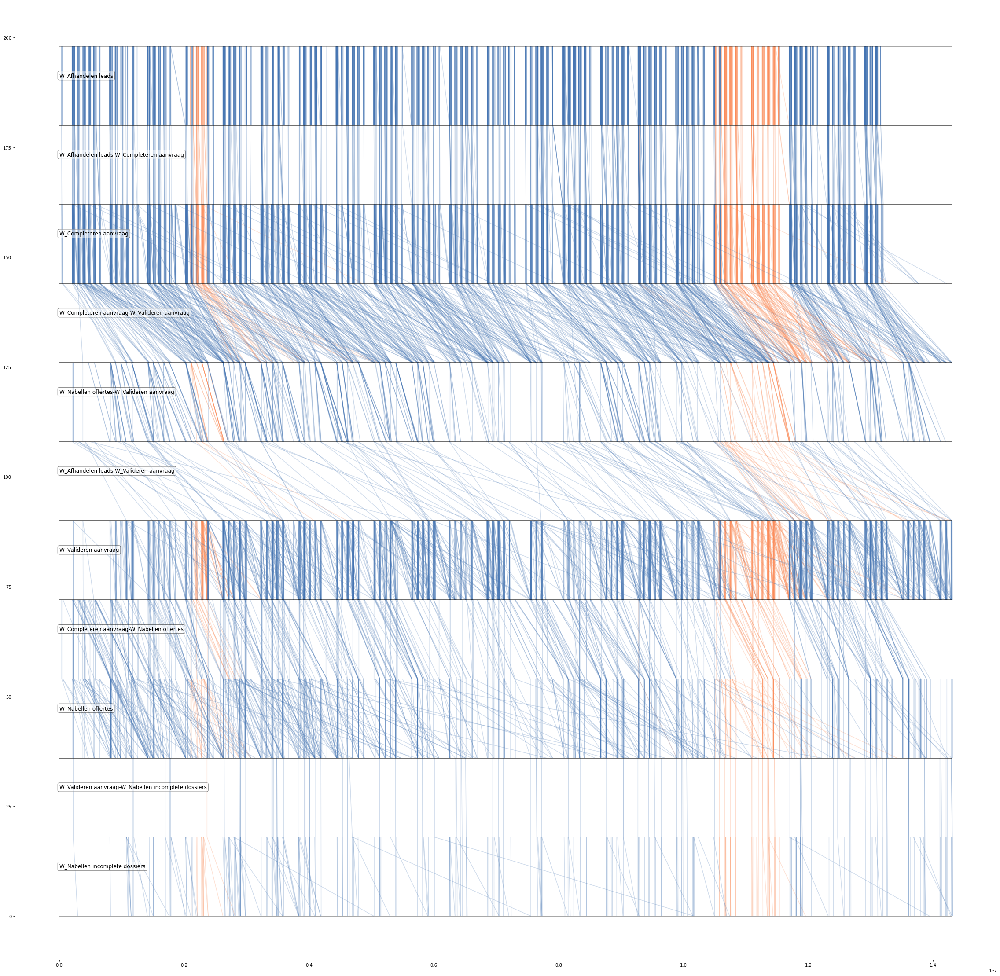

In [41]:
class_colors = [(69/256, 117/256, 180/256),
                (252/256, 141/256,89/256)]
fig, ax = plt.subplots(figsize=[40,40])
bpi12.plot_performance_spectrum(class_colors, ax, mask=bpi12.pf['queue'] > 200, vis_mask=True)

In [82]:
bpi12.pf.to_csv('bpi12_newload.txt')